# Rainfall as a triggering factor of an infinite slope mechanism

© 2024 Daniel F. Ruiz, Exneyder A. Montoya-Araque y Universidad EAFIT.

This notebook can be interactively run in [Google - Colab](https://colab.research.google.com/github/AppliedMechanics-EAFIT/EAFIT_slope_stability/blob/main/notebooks/02_trigg_factors/infinite_slope_rainfall.ipynb).

This notebook runs the model ``TRIGRS`` (Transient Rainfall Infiltration and Grid-Based Regional Slope-Stability Analysis), developed by {cite:t}`Baum_etal_2002_TRIGRSFortranProgram` and {cite:t}`Baum_etal_2008_TRIGRSFortranProgram`, and parallelized later by {cite:t}`Alvioli_Baum_2016_ParallelizationTRIGRSModel`

## Required modules and global setup for plots

In [1]:
import os
import subprocess
import textwrap
import itertools
import requests

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.gaussian_process import GaussianProcessClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score

import statsmodels.api as sm


# import colorcet as cc
from IPython import get_ipython
from IPython.display import display

if 'google.colab' in str(get_ipython()):
    print('Running on CoLab. Installing the required modules...')
    subprocess.run('pip install ipympl', shell=True);
    from google.colab import output, files
    output.enable_custom_widget_manager()
else:
    import tkinter as tk
    from tkinter.filedialog import askopenfilename

from pytrigrs.pytrigrs import create_dirs, run_topoidx, run_trigrs, get_cell_df
from pytrigrs.pytrigrs import create_asc_files_1cell_case, set_val_asc
from pytrigrs.tol_colors import tol_cmap, tol_cset




# Figures setup
%matplotlib widget
# plt.style.use("default")
mpl.rcParams.update(
    {
        'figure.constrained_layout.use': True,
        'interactive': False,
        "text.usetex": False,  # Use mathtext, not LaTeX
        "font.family": "DejaVu Serif",  # Use the Computer modern font
        "mathtext.fontset": "cm",
        "axes.formatter.use_mathtext": True,
        "axes.unicode_minus": False,
    }
)

tol_cols = ["#004488", "#DDAA33", "#BB5566"]

In [2]:
simulate_cases = False  # Set to False to skip the simulation part

## Creating directories

In [3]:
# Create a folder to store TRIGRS executables and the required files
work_dir = os.getcwd()
exec_dir = os.path.join(work_dir, "TRIGRS_thresholds")
create_dirs(exec_dir)
exec_dir

'/mnt/d/OneDrive - Universidad EAFIT/EAMA/Dev/GitHub/EAFIT_slope_stability/notebooks/02_trigg_factors/TRIGRS_thresholds'

In [4]:
os.listdir(exec_dir)

['df_thresholds.csv',
 'Exe_TopoIndex',
 'Exe_TRIGRS_ser',
 'inputs',
 'outputs',
 'TopoIndexLog_ONE_CELL.txt',
 'tpx_in_ONE_CELL.txt',
 'tr_in_ONE_CELL_UF.txt',
 'tr_in_RT_0_UF.txt',
 'tr_in_RT_100_UF.txt',
 'tr_in_RT_101_UF.txt',
 'tr_in_RT_102_UF.txt',
 'tr_in_RT_103_UF.txt',
 'tr_in_RT_104_UF.txt',
 'tr_in_RT_105_UF.txt',
 'tr_in_RT_106_UF.txt',
 'tr_in_RT_107_UF.txt',
 'tr_in_RT_108_UF.txt',
 'tr_in_RT_109_UF.txt',
 'tr_in_RT_10_UF.txt',
 'tr_in_RT_110_UF.txt',
 'tr_in_RT_111_UF.txt',
 'tr_in_RT_112_UF.txt',
 'tr_in_RT_113_UF.txt',
 'tr_in_RT_114_UF.txt',
 'tr_in_RT_115_UF.txt',
 'tr_in_RT_116_UF.txt',
 'tr_in_RT_117_UF.txt',
 'tr_in_RT_118_UF.txt',
 'tr_in_RT_119_UF.txt',
 'tr_in_RT_11_UF.txt',
 'tr_in_RT_120_UF.txt',
 'tr_in_RT_121_UF.txt',
 'tr_in_RT_122_UF.txt',
 'tr_in_RT_123_UF.txt',
 'tr_in_RT_124_UF.txt',
 'tr_in_RT_125_UF.txt',
 'tr_in_RT_126_UF.txt',
 'tr_in_RT_127_UF.txt',
 'tr_in_RT_128_UF.txt',
 'tr_in_RT_129_UF.txt',
 'tr_in_RT_12_UF.txt',
 'tr_in_RT_130_UF.txt',
 't

## Functions

## Loading executables and input files

In [5]:
def download_file_from_github(file, url_path, output_path):
    url = f"{url_path}/{file}"
    response = requests.get(url)  # Send a GET request to the URL
    if response.status_code == 200:  # Check if the request was successful
        output_path = f"{output_path}/{file}"
        with open(output_path, 'wb') as file:  # Write the content to a file
            file.write(response.content)
            os.chmod(output_path, 0o755)  # change permissions to allow execution
        print(f"File downloaded successfully and saved to {output_path}")
    else:
        print(f"Failed to download file. HTTP status code: {response.status_code}")


url_path = "https://raw.githubusercontent.com/eamontoyaa/data4testing/main/trigrs/"  # URL of the raw file on GitHub

### TopoIndex

In [6]:
file = "Exe_TopoIndex"  # Name of the file to download
download_file_from_github(file, url_path, exec_dir)

File downloaded successfully and saved to /mnt/d/OneDrive - Universidad EAFIT/EAMA/Dev/GitHub/EAFIT_slope_stability/notebooks/02_trigg_factors/TRIGRS_thresholds/Exe_TopoIndex


### TRIGRS

In [7]:
file = "Exe_TRIGRS_ser"  # Name of the file to download
download_file_from_github(file, url_path, exec_dir)

File downloaded successfully and saved to /mnt/d/OneDrive - Universidad EAFIT/EAMA/Dev/GitHub/EAFIT_slope_stability/notebooks/02_trigg_factors/TRIGRS_thresholds/Exe_TRIGRS_ser


In [8]:
# Check the files in the executables folder
os.listdir(exec_dir)

['df_thresholds.csv',
 'Exe_TopoIndex',
 'Exe_TRIGRS_ser',
 'inputs',
 'outputs',
 'TopoIndexLog_ONE_CELL.txt',
 'tpx_in_ONE_CELL.txt',
 'tr_in_ONE_CELL_UF.txt',
 'tr_in_RT_0_UF.txt',
 'tr_in_RT_100_UF.txt',
 'tr_in_RT_101_UF.txt',
 'tr_in_RT_102_UF.txt',
 'tr_in_RT_103_UF.txt',
 'tr_in_RT_104_UF.txt',
 'tr_in_RT_105_UF.txt',
 'tr_in_RT_106_UF.txt',
 'tr_in_RT_107_UF.txt',
 'tr_in_RT_108_UF.txt',
 'tr_in_RT_109_UF.txt',
 'tr_in_RT_10_UF.txt',
 'tr_in_RT_110_UF.txt',
 'tr_in_RT_111_UF.txt',
 'tr_in_RT_112_UF.txt',
 'tr_in_RT_113_UF.txt',
 'tr_in_RT_114_UF.txt',
 'tr_in_RT_115_UF.txt',
 'tr_in_RT_116_UF.txt',
 'tr_in_RT_117_UF.txt',
 'tr_in_RT_118_UF.txt',
 'tr_in_RT_119_UF.txt',
 'tr_in_RT_11_UF.txt',
 'tr_in_RT_120_UF.txt',
 'tr_in_RT_121_UF.txt',
 'tr_in_RT_122_UF.txt',
 'tr_in_RT_123_UF.txt',
 'tr_in_RT_124_UF.txt',
 'tr_in_RT_125_UF.txt',
 'tr_in_RT_126_UF.txt',
 'tr_in_RT_127_UF.txt',
 'tr_in_RT_128_UF.txt',
 'tr_in_RT_129_UF.txt',
 'tr_in_RT_12_UF.txt',
 'tr_in_RT_130_UF.txt',
 't

## Running the TRIGRS model for a one-cell spatial domain

### General inputs

In [9]:
proj_name = "ONE_CELL"
slope = 40  # [°]
zmax = 1.0  # [m]
depth_wt = 1.0  # [m]
model_log = "UF"  # Choose among UF, UI, SF, SI → | U: unsaturated | S: saturated | F: finite | I: infinite |
rainfall_int =  np.array([4.5]) / 36e5  # [m/s]
cumul_duration = 3600 *  np.array([0, 24]) # [s]  Always starts at 0 and contains n+1 elements, where n is the number of rainfall intensities values
output_times = 3600 * np.array([0, 3, 8, 12, 18, 24]) # [s]  It does not have to include the same values as cumul_duration

### Creating `.asc` files

In [10]:
# Create the input files for the one-cell case
create_asc_files_1cell_case(exec_dir)

# Set the values for the ascii input files
set_val_asc(exec_dir, 'dem', 0)
set_val_asc(exec_dir, 'zmax', zmax)
set_val_asc(exec_dir, 'depthwt', depth_wt)
set_val_asc(exec_dir, 'slope', slope)
set_val_asc(exec_dir, 'directions', 1)
set_val_asc(exec_dir, 'zones', 1)


In [11]:
# Running TopoIndex
tpx_inputs = {
    "flow_dir_scheme": 2,
    "exponent_weight_fact": -1,
    "iterarions": 10,
    "proj_name": proj_name,
}
run_topoidx(tpx_inputs, exec_dir, print_stdout=False)

In [12]:
trg_inputs = {
    "proj_name": proj_name,  # Name of the project
    "model": model_log,  # S-saturated or U-unsaturated + F-finite or I-infinite
    "tx": 20, # [] tx*nper determines how many time steps are used in the computations
    "nmax": 30,  # [] Ma number of roots 𝚲n and terms in series solutions for UNS.zone
    "mmax": 100,  # [] Max number of terms in series solution for FIN depth. If <0: INF depth
    "zones": 1,  # [] Number of zones
    "nzs": 20,  # [] Vertical increments until zmax
    "nper": len(rainfall_int),  # [-] Periods of rainfall (N)
    "t": cumul_duration[-1],  # [s] Elapsed time since the start of the storm (t)
    "zmax": zmax + .01,  # [m] Max. depth to compute Fs and Ψ (if <0 read from grid file)
    "depth": depth_wt + 0.01,  # [m] Water table depth (d) (if <0 read from grid file)
    "rizero": 1.5e-7,  # [m/s] Steady pre-storm and long-term infilt. (Izlt) (if <0 read from grid file)
    "geoparams":{
        1: {
            "c": 3e3,  # [Pa] soil cohesion for effective stress (c')
            "φ": 33.6,  # [deg] soil friction angle for effective stress (φ')
            "γ_sat": 20.0e3,  # [N/m3]  unit weight of soil (γs)
            "D_sat": 5.0e-5,  # [m2/s] Saturated hydraulic diffusivity (D0)
            "K_sat": 1.0e-5,  # [m/s] Saturated hydraulic conductivity (Ks)
            "θ_sat": 0.41,  # [-] Saturated water content (θs)
            "θ_res": 0.06,  # [-] Residual water content (θr)
            "α": 3,  # [1/m] Fitting parameter. If <0: saturated infiltration
        }
    },
    "cri": tuple(rainfall_int),  # [m/s] Rainfall intensities  (Inz)
    "capt": tuple(cumul_duration),  # [s] Cumulative duration of rainfall cri[i]
    "flowdir": "gener",  # Method for maximum allowed Ψ ("gener", "slope", or "hydro"))
    "n_outputs": len(output_times),  # [-] No of raster outputs at different t
    "t_n_outputs": tuple(output_times),#t,  # [s] Time at which to save raster files
    "ψ_flag": -4,
    "parallel": False,  # [-] Run in parallel
    "NP" : 4, # Number of processors
    # "inz_n_outputs": inz_n_outputs #inz,  # [s] Rainfall intensities at which to save raster files
}

run_trigrs(trg_inputs, exec_dir, print_stdout=True)

 
 TRIGRS: Transient Rainfall Infiltration
 and Grid-based Regional Slope-Stability
                Analysis
        Version 2.1.00c, 02 Feb 2022
   By Rex L. Baum and William Z. Savage
        U.S. Geological Survey
 -----------------------------------------
 
 Opening default initialization file
 TRIGRS, version 2.1.00c, (meter-kilogram-second-degrees units)                                                                                                                                                                                                 
 Unsaturated infiltration model selected for cells in zone           1 .
 ******** Zone            1  *********
 Using unsaturated infiltration model.
 ********  ********  ********  *********
 TRIGRS_thresholds/inputs/TIgrid_size.txt F
 TRIGRS_thresholds/inputs/GMgrid_size.txt F
 TRIGRS_thresholds/inputs/TRgrid_size.txt T
 Reading input grids
 One property zone, no grid required!
 Testing and adjusting steady infiltration rates
 Adjusted st

## Output to dataframe

In [13]:
df_cell = get_cell_df(trg_inputs, exec_dir, cell=(0, 0), time_id=5)
df_cell.head()

,i,j,elev,z,ψ,θ,zone,c,φ,γ_sat,...,α,δ,χ,Gs,γ_nat,γ_avg,fs,time_id,t_s,t_h
0,0,0,-0.00100,0.00100,-0.5461,0.1938,1.0,3000.0,33.6,20000.0,...,3,40.0,0.382286,2.764095,17881.24,17881.240000,3.0,5,64800.0,18.0
1,0,0,-0.05145,0.05145,-0.5260,0.1986,1.0,3000.0,33.6,20000.0,...,3,40.0,0.396000,2.764095,17928.28,17904.760000,3.0,5,64800.0,18.0
2,0,0,-0.10190,0.10190,-0.5050,0.2039,1.0,3000.0,33.6,20000.0,...,3,40.0,0.411143,2.764095,17980.22,17929.913333,3.0,5,64800.0,18.0
3,0,0,-0.15235,0.15235,-0.4832,0.2095,1.0,3000.0,33.6,20000.0,...,3,40.0,0.427143,2.764095,18035.10,17956.210000,3.0,5,64800.0,18.0
4,0,0,-0.20280,0.20280,-0.4605,0.2156,1.0,3000.0,33.6,20000.0,...,3,40.0,0.444571,2.764095,18094.88,17983.944000,3.0,5,64800.0,18.0


In [14]:
df_cell.iloc[-1]['fs']

0.9564599447434862

## Verification of FS and head pressure at a point

In [15]:
clrs = ['#6F4C9B', '#6059A9', '#5568B8', '#4E79C5', '#4D8AC6', '#4E96BC',
        '#549EB3', '#59A5A9', '#60AB9E', '#69B190', '#77B77D', '#8CBC68',
        '#A6BE54', '#BEBC48', '#D1B541', '#DDAA3C', '#E49C39', '#E78C35', 
        '#E67932', '#E4632D', '#DF4828', '#DA2222']
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap_name', clrs)
# cmap

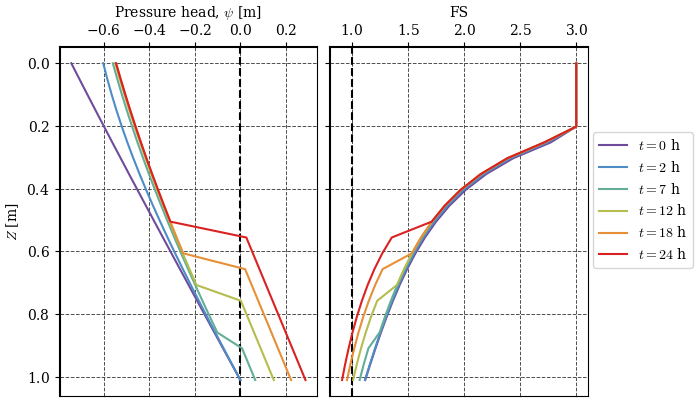

In [16]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(7, 4), sharey=True, layout='constrained')

palette = mpl.colormaps['gnuplot_r']
palette = cmap
for ax in axs:
    ax.grid(True, color='0.3', ls='--', lw=0.7)
    ax.spines["top"].set_linewidth(1.5)
    ax.spines["left"].set_linewidth(1.5)
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_tick_params(top=True, bottom=False)
    ax.xaxis.set_label_position('top')
    ax.set_prop_cycle('color', palette(np.linspace(0, 1, len(output_times))))

axs[0].axvline(0, color='k', lw=1.5, ls='--')
axs[1].axvline(1, color='k', lw=1.5, ls='--')

for n in np.arange(len(output_times)) + 1:
    file = f'TRIGRS_thresholds/outputs/TR_ijz_p_th/TR_ijz_p_th_{proj_name}_{model_log}_{n}.txt'
    df_cell = get_cell_df(trg_inputs, exec_dir, cell=(0, 0), time_id=n)
    t = df_cell['t_h'].iloc[0]
    axs[0].plot(df_cell['ψ'], df_cell['z'], label=f'$t={t:.0f}$ h')
    axs[1].plot(df_cell['fs'], df_cell['z'], label=f'$t={t:.0f}$ h')
    axs[0].set(xlabel='Pressure head, $\\psi$ [m]', ylabel='$Z$ [m]')
    axs[1].set(xlabel='FS')
    
axs[1].invert_yaxis()
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='outside right center')
fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('./figs/one_cell_trigrs_example.svg', bbox_inches='tight')

## Probabilistic rainfall thresholds based on PB simulations

### Numerical simulations of cases considering random rainfall scenarios and uncertainties in geotechnical parameters

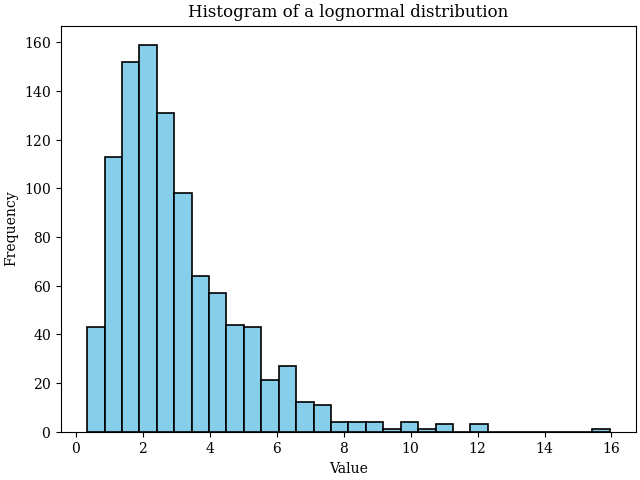

In [17]:
# Function to compute the parameters of the underlying normal distribution
def underlying_parameters(mu_X, sigma_X):
    mu_Y = np.log((mu_X**2) / np.sqrt(sigma_X**2 + mu_X**2))
    sigma_Y = np.sqrt(np.log((sigma_X**2 / mu_X**2) + 1))
    return mu_Y, sigma_Y

# Given mean and standard deviation of the lognormal distribution
mu_X = 3  # Example mean of the lognormal distribution
sigma_X = 2  # Example standard deviation of the lognormal distribution

# Compute the parameters for the underlying normal distribution
mu_Y, sigma_Y = underlying_parameters(mu_X, sigma_X)

# Set a seed for reproducibility
seed = 123
rng = np.random.default_rng(seed)

# Size of the sample
size = 1000

# Generate a sample from the lognormal distribution using the underlying normal distribution parameters
lognormal_sample = rng.lognormal(mu_Y, sigma_Y, size)

# Plot the histogram of the sample
fig, ax = plt.subplots()
ax.hist(lognormal_sample, bins=30, color='skyblue', edgecolor='black', linewidth=1.2)
ax.set(xlabel='Value', ylabel='Frequency', title='Histogram of a lognormal distribution')
plt.show()


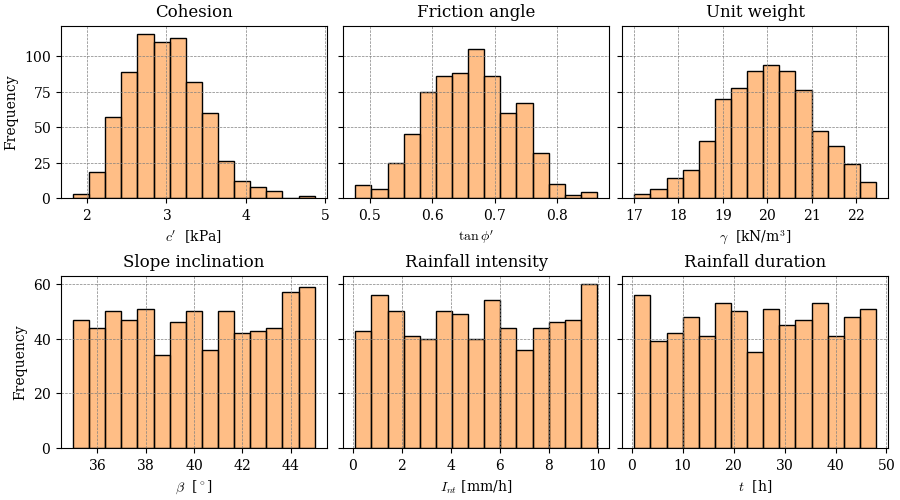

In [18]:
n = 700
seed = 101
rng = np.random.default_rng(seed)
cases = np.arange(n)

c_mean, c_cov = 3e3, 0.15
c_std = c_cov * c_mean
c_mean_und, c_std_und = underlying_parameters(c_mean, c_std)
c_sample = rng.lognormal(c_mean_und, c_std_und, n)  # [Pa]

phi_mean, phi_cov = np.tan(np.deg2rad(33.6)), 0.10
phi_sample = np.rad2deg(np.arctan(rng.normal(phi_mean, phi_cov*phi_mean, n)))  # [°]

gammma_mean, gamma_cov = 20e3, 0.05
gamma_sample = rng.normal(gammma_mean, gamma_cov*gammma_mean, n)  # [N/m3]

slope_mean = 40
slope_sample = rng.uniform(slope_mean - 5, slope_mean + 5, n)  # [°]

rainfall_int_sample = rng.uniform(0.1, 10, n)  # [mm/h]
# rainfall_int_mean, rainfall_int_cov = 3, 0.5
# rainfall_int_std = rainfall_int_cov * rainfall_int_mean
# rainfall_int_mean_und, rainfall_int_std_und = underlying_parameters(rainfall_int_mean, rainfall_int_std)
# rainfall_int_sample = rng.lognormal(rainfall_int_mean_und, rainfall_int_std_und, n)  # [mm/s]

cumul_duration_sample = rng.uniform(0.5, 2*24, n)  # [h]
# cumul_duration_mean, cumul_duration_cov = 12, .5
# cumul_duration_std = cumul_duration_cov * cumul_duration_mean
# cumul_duration_mean_und, cumul_duration_std_und = underlying_parameters(cumul_duration_mean, cumul_duration_std)
# cumul_duration_sample = rng.lognormal(cumul_duration_mean_und, cumul_duration_std_und, n)  # [h]


# Dataframe containing all the cases
df_thresholds = pd.DataFrame({
    'case': cases,
    'c': c_sample,
    'φ': phi_sample,
    'γ': gamma_sample,
    'δ': slope_sample,
    'Inz': rainfall_int_sample,
    't': cumul_duration_sample,
    'fs_t0': None,
    'fs_tf': None
})

# Plot the histogram of the samples
fig, axs = plt.subplots(nrows=2, ncols=3, layout='constrained', figsize=(9, 5), sharex=False, sharey='row')
# fill_col = mpl.colors.to_rgba(tol_cols[1], alpha=0.5)
fill_col = mpl.colors.to_rgba('C1', alpha=0.5)
common_pars = {'color': fill_col, 'bins': 15, 'edgecolor': 'k', 'linewidth': 1.0, 'density': False}
# Cohesion
axs[0, 0].hist(1e-3*c_sample, **common_pars)
axs[0, 0].set(xlabel="$c'$  [kPa]", ylabel='Frequency', title='Cohesion')
# Friction angle
axs[0, 1].hist(np.tan(np.deg2rad(phi_sample)), **common_pars)
axs[0, 1].set(xlabel="$\\tan \\phi'$", title='Friction angle')
# Unit weigth
axs[0, 2].hist(1e-3*gamma_sample, **common_pars)
axs[0, 2].set(xlabel="$\\gamma$  [kN/m$^3$]", title='Unit weight')
# Slope inclination
axs[1, 0].hist(slope_sample, **common_pars)
axs[1, 0].set(xlabel="$\\beta$  [$^\circ$]", ylabel='Frequency', title='Slope inclination')
# Rainfall intensity
axs[1, 1].hist(rainfall_int_sample, **common_pars)
axs[1, 1].set(xlabel="$I_{nt}$ [mm/h]", title='Rainfall intensity')
# Rainfall duration
axs[1, 2].hist(cumul_duration_sample, **common_pars)
axs[1, 2].set(xlabel="$t$  [h]", title='Rainfall duration')

for ax in axs.flat:
    ax.grid(True, color='0.5', ls='--', lw=0.5)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
fig.savefig('figs/histograms.svg', dpi=300, bbox_inches='tight')
plt.show()


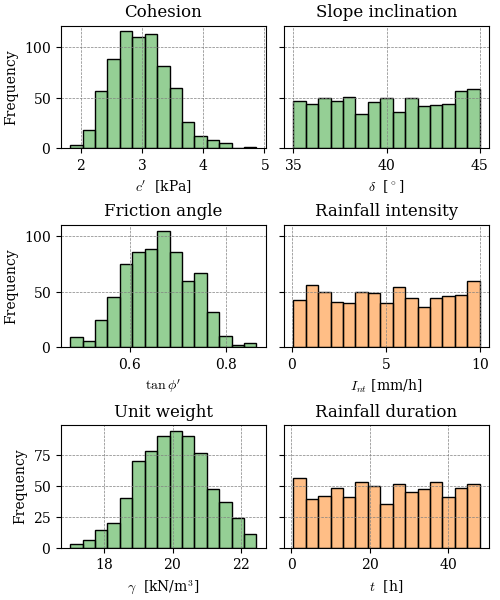

In [162]:
n = 700
seed = 101
rng = np.random.default_rng(seed)
cases = np.arange(n)

c_mean, c_cov = 3e3, 0.15
c_std = c_cov * c_mean
c_mean_und, c_std_und = underlying_parameters(c_mean, c_std)
c_sample = rng.lognormal(c_mean_und, c_std_und, n)  # [Pa]

phi_mean, phi_cov = np.tan(np.deg2rad(33.6)), 0.10
phi_sample = np.rad2deg(np.arctan(rng.normal(phi_mean, phi_cov*phi_mean, n)))  # [°]

gammma_mean, gamma_cov = 20e3, 0.05
gamma_sample = rng.normal(gammma_mean, gamma_cov*gammma_mean, n)  # [N/m3]

slope_mean = 40
slope_sample = rng.uniform(slope_mean - 5, slope_mean + 5, n)  # [°]

rainfall_int_sample = rng.uniform(0.1, 10, n)  # [mm/h]
# rainfall_int_mean, rainfall_int_cov = 3, 0.5
# rainfall_int_std = rainfall_int_cov * rainfall_int_mean
# rainfall_int_mean_und, rainfall_int_std_und = underlying_parameters(rainfall_int_mean, rainfall_int_std)
# rainfall_int_sample = rng.lognormal(rainfall_int_mean_und, rainfall_int_std_und, n)  # [mm/s]

cumul_duration_sample = rng.uniform(0.5, 2*24, n)  # [h]
# cumul_duration_mean, cumul_duration_cov = 12, .5
# cumul_duration_std = cumul_duration_cov * cumul_duration_mean
# cumul_duration_mean_und, cumul_duration_std_und = underlying_parameters(cumul_duration_mean, cumul_duration_std)
# cumul_duration_sample = rng.lognormal(cumul_duration_mean_und, cumul_duration_std_und, n)  # [h]


# Dataframe containing all the cases
df_thresholds = pd.DataFrame({
    'case': cases,
    'c': c_sample,
    'φ': phi_sample,
    'γ': gamma_sample,
    'δ': slope_sample,
    'Inz': rainfall_int_sample,
    't': cumul_duration_sample,
    'fs_t0': None,
    'fs_tf': None
})

# Plot the histogram of the samples
fig, axs = plt.subplots(nrows=3, ncols=2, layout='constrained', figsize=(5, 6), sharex=False, sharey='row')
fill_col = mpl.colors.to_rgba(tol_cols[1], alpha=0.5)
fill_col = mpl.colors.to_rgba('C2', alpha=0.5)
common_pars = {'color': fill_col, 'bins': 15, 'edgecolor': 'k', 'linewidth': 1.0, 'density': False}
# Cohesion
axs[0, 0].hist(1e-3*c_sample, **common_pars)
axs[0, 0].set(xlabel="$c'$  [kPa]", ylabel='Frequency', title='Cohesion')
# Friction angle
axs[1, 0].hist(np.tan(np.deg2rad(phi_sample)), **common_pars)
axs[1, 0].set(xlabel="$\\tan \\phi'$", ylabel='Frequency', title='Friction angle')
# Unit weigth
axs[2, 0].hist(1e-3*gamma_sample, **common_pars)
axs[2, 0].set(xlabel="$\\gamma$  [kN/m$^3$]", ylabel='Frequency', title='Unit weight')
# Slope inclination
axs[0, 1].hist(slope_sample, **common_pars)
axs[0, 1].set(xlabel="$\\delta$  [$^\circ$]", title='Slope inclination')
common_pars['color'] = mpl.colors.to_rgba('C1', alpha=0.5)
# Rainfall intensity
axs[1, 1].hist(rainfall_int_sample, **common_pars)
axs[1, 1].set(xlabel="$I_{nt}$ [mm/h]", title='Rainfall intensity')
# Rainfall duration
axs[2, 1].hist(cumul_duration_sample, **common_pars)
axs[2, 1].set(xlabel="$t$  [h]", title='Rainfall duration')

for ax in axs.flat:
    ax.grid(True, color='0.5', ls='--', lw=0.5)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
fig.savefig('figs/histograms.svg', dpi=300, bbox_inches='tight')
plt.show()


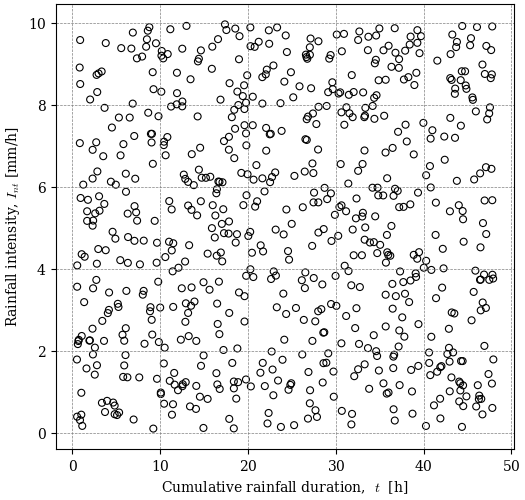

In [20]:
# Plot the scatter plot of the samples of rainfall intensity and cumulative duration
fig, ax = plt.subplots(figsize=(5.25, 5))
ax.scatter(cumul_duration_sample, rainfall_int_sample, marker='o', edgecolors='k', facecolors='none', s=25, linewidths=.8)
ax.set(xlabel='Cumulative rainfall duration,  $t$  [h]', ylabel='Rainfall intensity, $I_{nt}$ [mm/h]')
ax.grid(True, color='0.5', ls='--', lw=0.5)

xlim, ylim = ax.get_xlim(), ax.get_ylim()

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
fig.savefig('figs/all_realizations.svg', dpi=300, bbox_inches='tight')
plt.show()

In [21]:
# Create the input files for the one-cell case
create_asc_files_1cell_case(exec_dir)

# Set the values for the ascii input files
set_val_asc(exec_dir, 'dem', 0)
set_val_asc(exec_dir, 'zmax', zmax)
set_val_asc(exec_dir, 'depthwt', depth_wt)
set_val_asc(exec_dir, 'directions', 1)
set_val_asc(exec_dir, 'zones', 1)

# Constants
zmax = 1.0  # [m]
depth_wt = 1.0  # [m]
model_log = "UF"  # Choose among UF, UI, SF, SI → | U: unsaturated | S: saturated | F: finite | I: infinite |

# Run TRIGRS for each case
if simulate_cases:
    for i, c, φ, γ, δ, Inz, t in zip(cases, c_sample, phi_sample, gamma_sample, slope_sample, rainfall_int_sample, cumul_duration_sample):

        proj_name = f"RT_{i}"
        slope = δ  # [°]
        rainfall_int =  np.array([Inz]) / 36e5  # [m/s]
        cumul_duration = 3600 *  np.array([0, t]) # [s]  Always starts at 0 and contains n+1 elements, where n is the number of rainfall intensities values
        output_times = 3600 * np.linspace(0, t, 5) # [s]  It does not have to include the same values as cumul_duration

        set_val_asc(exec_dir, 'slope', δ)

        # Set TRIGRS inputs
        trg_inputs = {
            "proj_name": proj_name,  # Name of the project
            "model": model_log,  # S-saturated or U-unsaturated + F-finite or I-infinite
            "tx": 20, # [] tx*nper determines how many time steps are used in the computations
            "nmax": 30,  # [] Ma number of roots 𝚲n and terms in series solutions for UNS.zone
            "mmax": 100,  # [] Max number of terms in series solution for FIN depth. If <0: INF depth
            "zones": 1,  # [] Number of zones
            "nzs": 20,  # [] Vertical increments until zmax
            "nper": len(rainfall_int),  # [-] Periods of rainfall (N)
            "t": cumul_duration[-1],  # [s] Elapsed time since the start of the storm (t)
            "zmax": zmax + .01,  # [m] Max. depth to compute Fs and Ψ (if <0 read from grid file)
            "depth": depth_wt + 0.01,  # [m] Water table depth (d) (if <0 read from grid file)
            "rizero": 1.5e-7,  # [m/s] Steady pre-storm and long-term infilt. (Izlt) (if <0 read from grid file)
            "geoparams":{
                1: {
                    "c": c,  # [Pa] soil cohesion for effective stress (c')
                    "φ": φ,  # [deg] soil friction angle for effective stress (φ')
                    "γ_sat": γ,  # [N/m3]  unit weight of soil (γs)
                    "D_sat": 5.0e-5,  # [m2/s] Saturated hydraulic diffusivity (D0)
                    "K_sat": 1.0e-5,  # [m/s] Saturated hydraulic conductivity (Ks)
                    "θ_sat": 0.41,  # [-] Saturated water content (θs)
                    "θ_res": 0.06,  # [-] Residual water content (θr)
                    "α": 3,  # [1/m] Fitting parameter. If <0: saturated infiltration
                }
            },
            "cri": tuple(rainfall_int),  # [m/s] Rainfall intensities  (Inz)
            "capt": tuple(cumul_duration),  # [s] Cumulative duration of rainfall cri[i]
            "flowdir": "gener",  # Method for maximum allowed Ψ ("gener", "slope", or "hydro"))
            "n_outputs": len(output_times),  # [-] No of raster outputs at different t
            "t_n_outputs": tuple(output_times),#t,  # [s] Time at which to save raster files
            "ψ_flag": -4,
            "parallel": False,  # [-] Run in parallel
            "NP" : 1, # Number of processors
            # "inz_n_outputs": inz_n_outputs #inz,  # [s] Rainfall intensities at which to save raster files
        }

        # Run TRIGRS
        run_trigrs(trg_inputs, exec_dir, print_stdout=False)

        # Get the factor of safety at the beginning and end of the storm
        df_cell_t0 = get_cell_df(trg_inputs, exec_dir, cell=(0, 0), time_id=1)
        fs_0 = df_cell_t0.iloc[-1]['fs']
        df_thresholds.loc[df_thresholds['case'] == i, 'fs_t0'] = fs_0

        df_cell_tf = get_cell_df(trg_inputs, exec_dir, cell=(0, 0), time_id=len(output_times))
        fs_tf = df_cell_tf.iloc[-1]['fs']
        df_thresholds.loc[df_thresholds['case'] == i, 'fs_tf'] = fs_tf

    # save the dataframe to a csv file
    df_thresholds.to_csv(f'{exec_dir}/df_thresholds.csv', index=False)
else:
    df_thresholds = pd.read_csv(f'{exec_dir}/df_thresholds.csv')

In [22]:
exec_dir

'/mnt/d/OneDrive - Universidad EAFIT/EAMA/Dev/GitHub/EAFIT_slope_stability/notebooks/02_trigg_factors/TRIGRS_thresholds'

In [23]:
# Add series evaluating wheter or not the slope failed
df_thresholds['failed'] = df_thresholds['fs_tf'] < 1
df_thresholds

,case,c,φ,γ,δ,Inz,t,fs_t0,fs_tf,failed
0,0,2636.949604,35.260509,22421.787230,44.376491,4.408605,35.850317,0.970076,0.753153,True
1,1,2190.192121,30.718263,19913.765452,41.433753,0.833382,41.871985,0.909941,0.909429,True
2,2,3246.181303,30.052116,19128.727380,36.245750,7.288467,22.468396,1.175136,0.852510,True
3,3,3315.175969,29.237902,17394.826450,39.542668,8.460964,25.856021,1.099516,0.697846,True
4,4,2832.875080,35.612410,20620.817710,44.338706,0.230025,22.210273,1.023733,1.023583,False
...,...,...,...,...,...,...,...,...,...,...
695,695,2454.247683,34.862055,19627.403203,38.651461,4.890526,28.009915,1.146932,0.866709,True
696,696,3239.089287,35.090801,20572.193947,36.093309,2.902310,24.334398,1.320121,1.163394,False
697,697,2751.705153,30.887060,21026.356663,38.315364,3.192100,1.328589,1.045078,1.044424,False
698,698,3169.230897,28.981809,18879.553793,39.352467,1.899530,6.037730,1.044579,1.042976,False


In [24]:
# Drop all the rows where fs_t0 < 1
df_thresholds = df_thresholds[df_thresholds['fs_t0'] > 1]
df_thresholds

,case,c,φ,γ,δ,Inz,t,fs_t0,fs_tf,failed
2,2,3246.181303,30.052116,19128.727380,36.245750,7.288467,22.468396,1.175136,0.852510,True
3,3,3315.175969,29.237902,17394.826450,39.542668,8.460964,25.856021,1.099516,0.697846,True
4,4,2832.875080,35.612410,20620.817710,44.338706,0.230025,22.210273,1.023733,1.023583,False
5,5,3133.902345,36.620875,19031.100675,38.651666,0.104358,9.205494,1.293632,1.293529,False
6,6,3829.063702,30.619009,19382.259384,41.439027,1.673116,33.278489,1.096583,1.094707,False
...,...,...,...,...,...,...,...,...,...,...
695,695,2454.247683,34.862055,19627.403203,38.651461,4.890526,28.009915,1.146932,0.866709,True
696,696,3239.089287,35.090801,20572.193947,36.093309,2.902310,24.334398,1.320121,1.163394,False
697,697,2751.705153,30.887060,21026.356663,38.315364,3.192100,1.328589,1.045078,1.044424,False
698,698,3169.230897,28.981809,18879.553793,39.352467,1.899530,6.037730,1.044579,1.042976,False


### Visualization

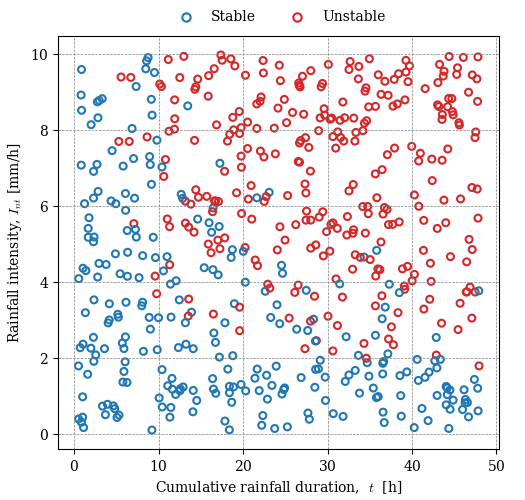

In [81]:
# red: failed, green: not failed, x: t, y: Inz
fig, ax = plt.subplots(figsize=(5.25, 5))
# edgecolors = df_thresholds['failed'].map({False: cols[0], True: cols[1]})
edge_cols = [mpl.colors.to_rgba('C0', alpha=1), mpl.colors.to_rgba('C3', alpha=1)] #'k'# cols[0]
fill_cols = mpl.colors.to_rgba('w', alpha=0.0)
# facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
edgecolors = df_thresholds['failed'].map({False: edge_cols[0], True: edge_cols[1]})
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=fill_cols, linewidths=1.5)
ax.set(xlabel='Cumulative rainfall duration,  $t$  [h]', ylabel='Rainfall intensity, $I_{nt}$ [mm/h]', aspect=4.5)
ax.grid(True, color='0.5', ls='--', lw=0.5)
# legend 
for label, format in zip(['Stable', 'Unstable'], edge_cols):
    ax.scatter([], [], marker='o', edgecolors=format, facecolors='w', label=label, linewidths=1.5)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)

xlim, ylim = ax.get_xlim(), ax.get_ylim()

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
fig.savefig('figs/filtered_realizations_binary.svg', dpi=300, bbox_inches='tight')
plt.show()

In [26]:
# # red: failed, green: not failed, x: t, y: Inz
# fig, ax = plt.subplots(figsize=(5.25, 5))
# # edgecolors = df_thresholds['failed'].map({False: cols[0], True: cols[1]})
# edgecolors = 'k'# cols[0]
# fill_cols = [mpl.colors.to_rgba(tol_cols[1], alpha=0.5), mpl.colors.to_rgba(tol_cols[0], alpha=0.5)]
# # facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
# facecolors = df_thresholds['failed'].map({False: fill_cols[0], True: fill_cols[1]})
# ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=.8)
# ax.set(xlabel='Cumulative rainfall duration,  $t$  [h]', ylabel='Rainfall intensity, $I_{nt}$ [mm/h]')
# ax.grid(True, color='0.5', ls='--', lw=0.5)
# # legend 
# for label, format in zip(['Stable', 'Unstable'], fill_cols):
#     ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
# ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)

# fig.canvas.header_visible = False
# fig.canvas.toolbar_position = 'bottom'
# # fig.savefig('figs/filtered_realizations_binary.svg', dpi=300, bbox_inches='tight')
# plt.show()

In [27]:
df_thresholds

,case,c,φ,γ,δ,Inz,t,fs_t0,fs_tf,failed
2,2,3246.181303,30.052116,19128.727380,36.245750,7.288467,22.468396,1.175136,0.852510,True
3,3,3315.175969,29.237902,17394.826450,39.542668,8.460964,25.856021,1.099516,0.697846,True
4,4,2832.875080,35.612410,20620.817710,44.338706,0.230025,22.210273,1.023733,1.023583,False
5,5,3133.902345,36.620875,19031.100675,38.651666,0.104358,9.205494,1.293632,1.293529,False
6,6,3829.063702,30.619009,19382.259384,41.439027,1.673116,33.278489,1.096583,1.094707,False
...,...,...,...,...,...,...,...,...,...,...
695,695,2454.247683,34.862055,19627.403203,38.651461,4.890526,28.009915,1.146932,0.866709,True
696,696,3239.089287,35.090801,20572.193947,36.093309,2.902310,24.334398,1.320121,1.163394,False
697,697,2751.705153,30.887060,21026.356663,38.315364,3.192100,1.328589,1.045078,1.044424,False
698,698,3169.230897,28.981809,18879.553793,39.352467,1.899530,6.037730,1.044579,1.042976,False


### Fitting models

In [28]:
# cmap = cc.m_CET_L18
# cmap

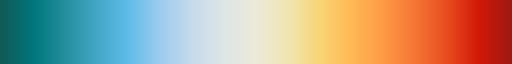

In [29]:
cmap = tol_cmap('nightfall')#.reversed()
# cmap = tol_cmap('iridescent')#.reversed()
cmap

In [30]:


# Prepare the data
# X = df_thresholds[['t', 'Inz']]
X = pd.DataFrame(data={'X': df_thresholds['t'], 'Y': df_thresholds['Inz']}).values

# X = sm.add_constant(X)  # Adds a constant term to the predictor
y = df_thresholds['failed'].astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1234321)

## Data to display the surface of the probability of failure 
x = np.linspace(df_thresholds['t'].min(), df_thresholds['t'].max(), 100)
y = np.linspace(df_thresholds['Inz'].min(), df_thresholds['Inz'].max(), 100)
xx, yy = np.meshgrid(x, y)

In [31]:
len(X_train), len(X_test)

(385, 166)

In [53]:
facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
facecolors = mpl.colors.to_rgba('w', alpha=0.0)

#### Logistic

Optimization terminated successfully.
         Current function value: 0.311058
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                 failed   No. Observations:                  385
Model:                          Logit   Df Residuals:                      382
Method:                           MLE   Df Model:                            2
Date:                Wed, 06 Nov 2024   Pseudo R-squ.:                  0.5494
Time:                        21:57:57   Log-Likelihood:                -119.76
converged:                       True   LL-Null:                       -265.77
Covariance Type:            nonrobust   LLR p-value:                 3.874e-64
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.9002      0.870     -9.082      0.000      -9.605      -6.195
x1             0.1402      0.

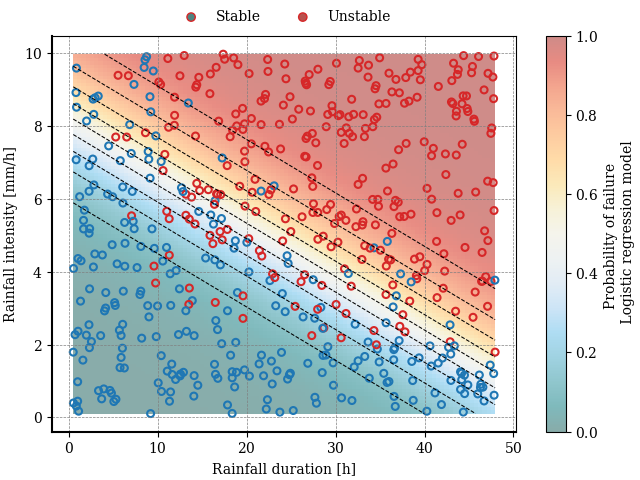

In [56]:
# Fit the logistic regression model
X_test_log = sm.add_constant(X_test)
X_train_log = sm.add_constant(X_train)
model_log = sm.Logit(y_train, X_train_log)
fitted_model_log = model_log.fit()

# Predict probabilities
y_pred_pr = fitted_model_log.predict(X_test_log)
y_pred = y_pred_pr > 0.5

# Print the summary of the model
print(fitted_model_log.summary())

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_log, tpr_log, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_log = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = fitted_model_log.predict(sm.add_constant(np.vstack([xx.ravel(), yy.ravel()]).T)).reshape(xx.shape)
# c = ax.contourf(xx, yy, Z, levels=10, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()),
              origin='lower', cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend  
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n Logistic regression model')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

              precision    recall  f1-score   support

           0       0.83      0.85      0.84        80
           1       0.86      0.84      0.85        86

    accuracy                           0.84       166
   macro avg       0.84      0.84      0.84       166
weighted avg       0.84      0.84      0.84       166



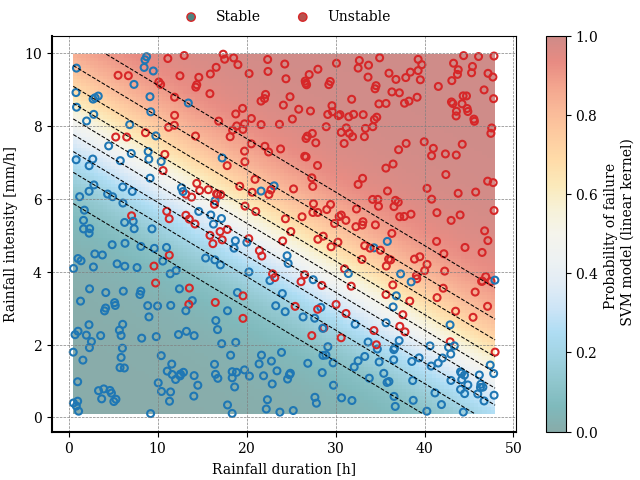

In [57]:
# Initialize and train the SVM model
model_log = LogisticRegression()
model_log.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_log.predict_proba(X_test)[:, 1]
y_pred = model_log.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_log_linear, tpr_log_linear, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_log_linear = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_log.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (linear kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### Probit

Optimization terminated successfully.
         Current function value: 0.309204
         Iterations 7
                          Probit Regression Results                           
Dep. Variable:                 failed   No. Observations:                  385
Model:                         Probit   Df Residuals:                      382
Method:                           MLE   Df Model:                            2
Date:                Wed, 06 Nov 2024   Pseudo R-squ.:                  0.5521
Time:                        21:57:58   Log-Likelihood:                -119.04
converged:                       True   LL-Null:                       -265.77
Covariance Type:            nonrobust   LLR p-value:                 1.898e-64
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.5212      0.458     -9.882      0.000      -5.418      -3.624
x1             0.0805      0.

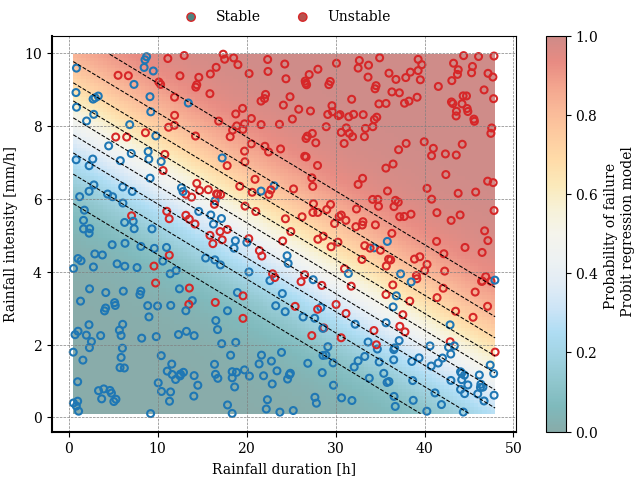

In [58]:
# Fit the logistic regression model
X_test_prob = sm.add_constant(X_test)
X_train_prob = sm.add_constant(X_train)
model_prob = sm.Probit(y_train, X_train_prob)
fitted_model_prob = model_prob.fit()

# Predict probabilities
y_pred_pr = fitted_model_prob.predict(X_test_prob)
y_pred = y_pred_pr > 0.5

# Print the summary of the model
print(fitted_model_prob.summary())

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_prob, tpr_prob, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_prob = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = fitted_model_prob.predict(sm.add_constant(np.vstack([xx.ravel(), yy.ravel()]).T)).reshape(xx.shape)
# c = ax.contourf(xx, yy, Z, levels=10, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n Probit regression model')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - Linear kernel

              precision    recall  f1-score   support

           0       0.83      0.85      0.84        80
           1       0.86      0.84      0.85        86

    accuracy                           0.84       166
   macro avg       0.84      0.84      0.84       166
weighted avg       0.84      0.84      0.84       166



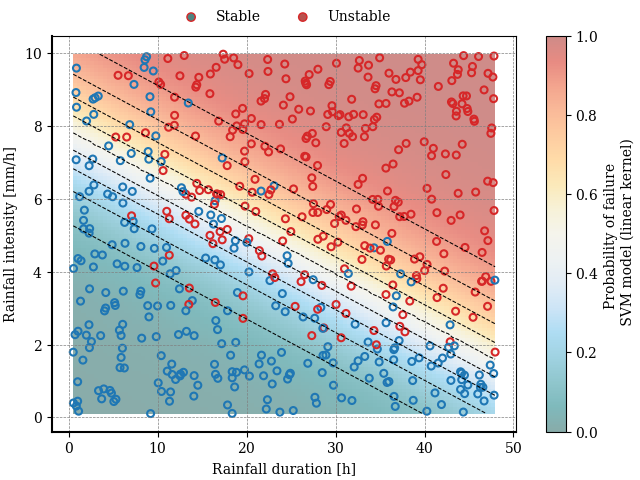

In [59]:
# Initialize and train the SVM model
model_svg = SVC(kernel='linear', probability=True, random_state=123)
model_svg.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test)[:, 1]
y_pred = model_svg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_linear, tpr_svg_linear, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_linear = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (linear kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - Loglinear kernel

              precision    recall  f1-score   support

           0       0.88      0.84      0.86        80
           1       0.86      0.90      0.88        86

    accuracy                           0.87       166
   macro avg       0.87      0.87      0.87       166
weighted avg       0.87      0.87      0.87       166



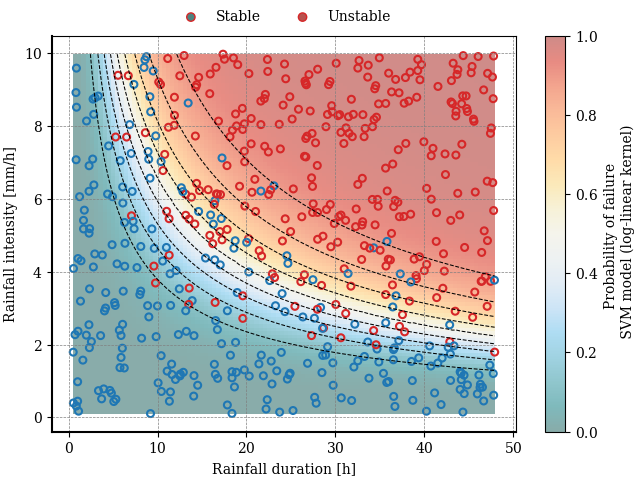

In [60]:
X_train_log = np.log(X_train)
X_test_log = np.log(X_test)

# Initialize and train the SVM model
model_svg = SVC(kernel='linear', probability=True, random_state=123)
model_svg.fit(X_train_log, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test_log)[:, 1]
y_pred = model_svg.predict(X_test_log)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_loglinear, tpr_svg_loglinear, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_loglinear = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.log(np.vstack([xx.ravel(), yy.ravel()]).T))[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (log-linear kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - $2^\mathrm{nd}$ degree polynomial kernel

              precision    recall  f1-score   support

           0       0.85      0.90      0.87        80
           1       0.90      0.85      0.87        86

    accuracy                           0.87       166
   macro avg       0.87      0.87      0.87       166
weighted avg       0.88      0.87      0.87       166



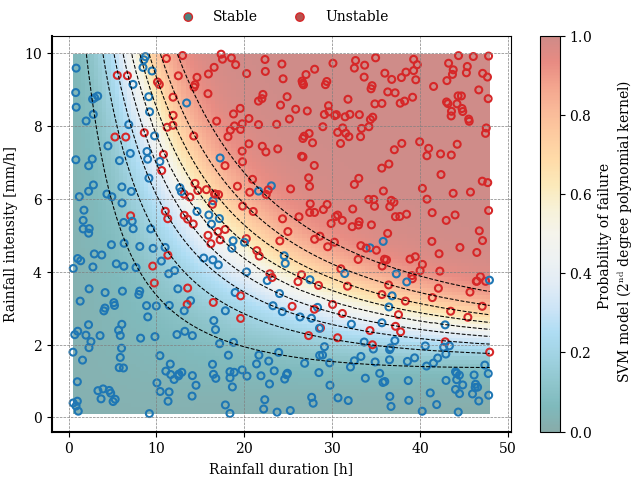

In [61]:
# Initialize and train the SVM model
model_svg = SVC(kernel='poly', probability=True, random_state=123, degree=2)
model_svg.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test)[:, 1]
y_pred = model_svg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_poly_2, tpr_svg_poly_2, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_poly_2 = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (2$^\\mathrm{nd}$ degree polynomial kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - $3^\mathrm{nd}$ degree polynomial kernel

              precision    recall  f1-score   support

           0       0.86      0.96      0.91        80
           1       0.96      0.85      0.90        86

    accuracy                           0.90       166
   macro avg       0.91      0.91      0.90       166
weighted avg       0.91      0.90      0.90       166



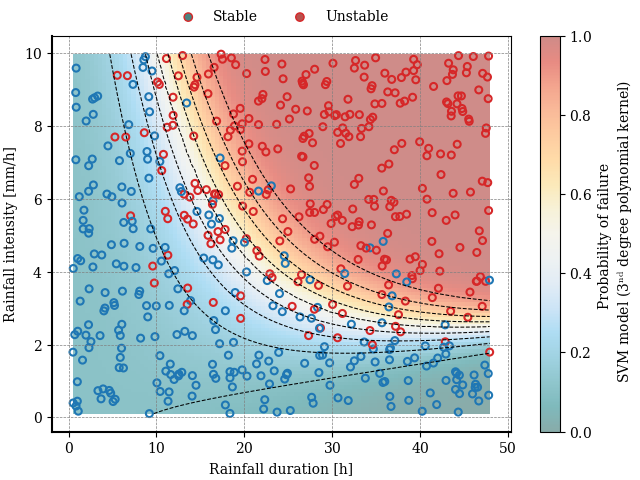

In [62]:
# Initialize and train the SVM model
model_svg = SVC(kernel='poly', probability=True, random_state=123, degree=3)
model_svg.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test)[:, 1]
y_pred = model_svg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_poly_3, tpr_svg_poly_3, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_poly_3 = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (3$^\\mathrm{nd}$ degree polynomial kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - RBF kernel

              precision    recall  f1-score   support

           0       0.86      0.89      0.87        80
           1       0.89      0.86      0.88        86

    accuracy                           0.87       166
   macro avg       0.87      0.87      0.87       166
weighted avg       0.87      0.87      0.87       166



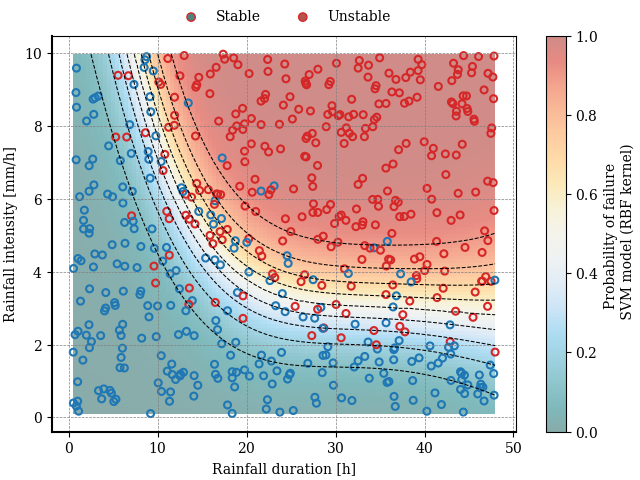

In [63]:
# Initialize and train the SVM model
model_svg = SVC(kernel='rbf', probability=True, random_state=123)
model_svg.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test)[:, 1]
y_pred = model_svg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_rbf, tpr_svg_rbf, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_rbf = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (RBF kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### SVG - Sigmoid kernel

              precision    recall  f1-score   support

           0       0.38      0.31      0.34        80
           1       0.45      0.52      0.48        86

    accuracy                           0.42       166
   macro avg       0.41      0.42      0.41       166
weighted avg       0.42      0.42      0.42       166



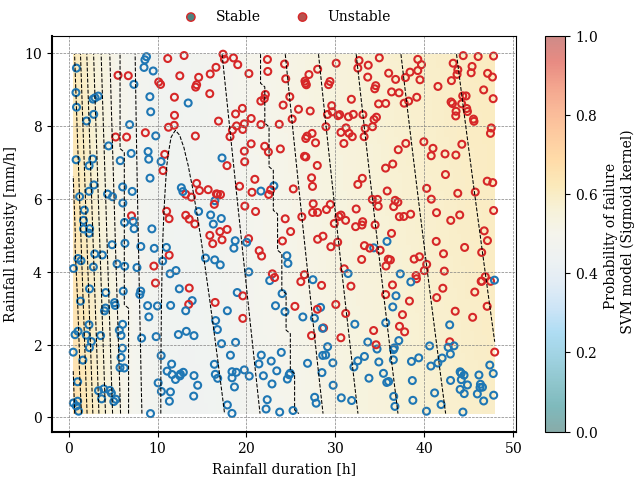

In [64]:
# Initialize and train the SVM model
model_svg = SVC(kernel='sigmoid', probability=True, random_state=123)
model_svg.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_svg.predict_proba(X_test)[:, 1]
y_pred = model_svg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_svg_sigmoid, tpr_svg_sigmoid, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_svg_sigmoid = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_svg.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n SVM model (Sigmoid kernel)')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### Gradient Boosting Classifier

              precision    recall  f1-score   support

           0       0.89      0.90      0.89        80
           1       0.91      0.90      0.90        86

    accuracy                           0.90       166
   macro avg       0.90      0.90      0.90       166
weighted avg       0.90      0.90      0.90       166



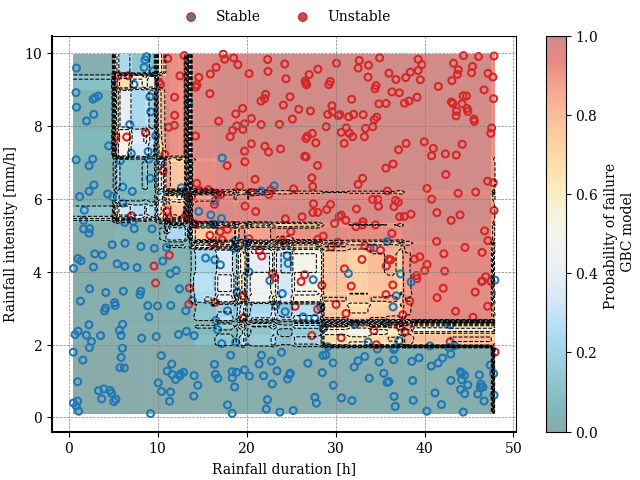

In [65]:
# Initialize and train the SVM model
model_gbm = GradientBoostingClassifier(random_state=123)
model_gbm.fit(X_train, y_train)

# Predict probabilities
y_pred_pr = model_gbm.predict_proba(X_test)[:, 1]
y_pred = model_gbm.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
fpr_gbm, tpr_gbm, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
auc_score_gbm = roc_auc_score(y_true=y_test, y_score=y_pred_pr)


# Plot the probability of failure surface
fig, ax = plt.subplots()
zz = model_gbm.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
# c = ax.contourf(xx, yy, zz, levels=10, cmap=cmap, alpha=0.5)#, vmin=0, vmax=1)
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
              cmap=cmap, alpha=0.5, aspect='auto', vmin=0, vmax=1)
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.75, linestyles='--')

# Plot settings
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', xlim=xlim, ylim=ylim)
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)

# legend 
for label, format in zip(['Stable', 'Unstable'], [mpl.colors.to_rgba("#125A56", alpha=0.75), mpl.colors.to_rgba("#A01813", alpha=0.75)]):
    ax.scatter([], [], marker='o', edgecolors=edgecolors, facecolors=format, label=label)
ax.legend(loc='lower center', ncols=2, bbox_to_anchor=(0.5, 1.0), frameon=False)
# colorbar
fig.colorbar(c, ax=ax, label='Probability of failure \n GBC model')

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

#### All in one

Optimization terminated successfully.
         Current function value: 0.309204
         Iterations 7


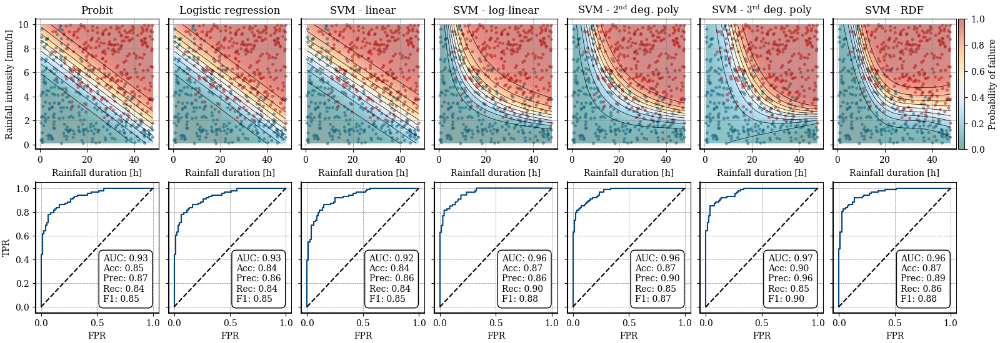

In [66]:
models = {
    'Probit': None,
    'Logistic regression': LogisticRegression(),
    'SVM - linear': SVC(kernel='linear', probability=True, random_state=123),
    'SVM - log-linear': SVC(kernel='linear', probability=True, random_state=123),
    'SVM - $2^\\mathrm{nd}$ deg. poly': SVC(kernel='poly', probability=True, random_state=123, degree=2),
    'SVM - $3^\\mathrm{rd}$ deg. poly': SVC(kernel='poly', probability=True, random_state=123, degree=3),
    'SVM - RDF': SVC(kernel='rbf', probability=True, random_state=123),
    # 'GPC': GaussianProcessClassifier(random_state=123),
    # 'SVM_sigmoid': SVC(kernel='sigmoid', probability=True, random_state=123),
    # 'Gradient Boosting': GradientBoostingClassifier()
}

facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("#125A56", alpha=0.5), True: mpl.colors.to_rgba("#A01813", alpha=0.5)})
# Plot the probability of failure surface
fig, axs = plt.subplots(nrows=2, ncols=7, figsize=(16, 5.5), sharex='row', sharey='row', layout='constrained')#

for i, (name, model) in enumerate(models.items()):
    if name == 'Probit':
        # Fit the probit model
        X_test_prob = sm.add_constant(X_test)
        X_train_prob = sm.add_constant(X_train)
        model_prob = sm.Probit(y_train, X_train_prob)
        fitted_model_prob = model_prob.fit()

        # Predict probabilities
        y_pred_pr = fitted_model_prob.predict(X_test_prob)
        y_pred = y_pred_pr > 0.5

        zz = fitted_model_prob.predict(sm.add_constant(np.vstack([xx.ravel(), yy.ravel()]).T)).reshape(xx.shape)
    elif name == 'SVM - log-linear':
        X_train_log, X_test_log = np.log(X_train), np.log(X_test)

        model.fit(X_train_log, y_train)
        y_pred_pr = model.predict_proba(X_test_log)[:, 1]
        y_pred = model.predict(X_test_log)

        zz = model.predict_proba(np.log(np.vstack([xx.ravel(), yy.ravel()]).T))[:, 1].reshape(xx.shape)
    else:
        model.fit(X_train, y_train)
        y_pred_pr = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

        zz = model.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)

    fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
    # auc_score = roc_auc_score(y_true=y_test, y_score=y_pred_pr)

    # metrics
    roc_auc = roc_auc_score(y_test, y_pred_pr)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Plot the probability of failure surface
    ax = axs[0, i]
    c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
                  cmap=cmap, alpha=0.5, vmin=0, vmax=1, aspect='auto')
    ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.5, linestyles='-')    
    ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=10, edgecolors=edgecolors, facecolors=facecolors, linewidths=.25)
    
    # Plot settings
    ax.set(xlabel='Rainfall duration [h]', xlim=xlim, ylim=ylim)
    ax.set_title(f'{name}')

    # Plot ROC curve
    ax = axs[1, i]
    ax.plot(fpr, tpr, c=tol_cols[0])
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set(xlabel='FPR')
    # ax.legend(loc='lower right', frameon=False)
    # text instead of legend
    ax.text(0.55, 0.07, f'AUC: {roc_auc:.2f}\nAcc: {accuracy:.2f}\nPrec: {precision:.2f}\nRec: {recall:.2f}\nF1: {f1:.2f}',
            verticalalignment='bottom', horizontalalignment='left', transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

axs[0, 0].set_ylabel('Rainfall intensity [mm/h]')
axs[1, 0].set_ylabel('TPR')

# General plot settings
for ax in axs.flatten():
    ax.grid(True, color='0.5', ls='--', lw=0.5)
    ax.spines[["left", "bottom"]].set_linewidth(1.5)

# colorbar 
fig.colorbar(c, ax=axs[0], label='Probability of failure', pad=0)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

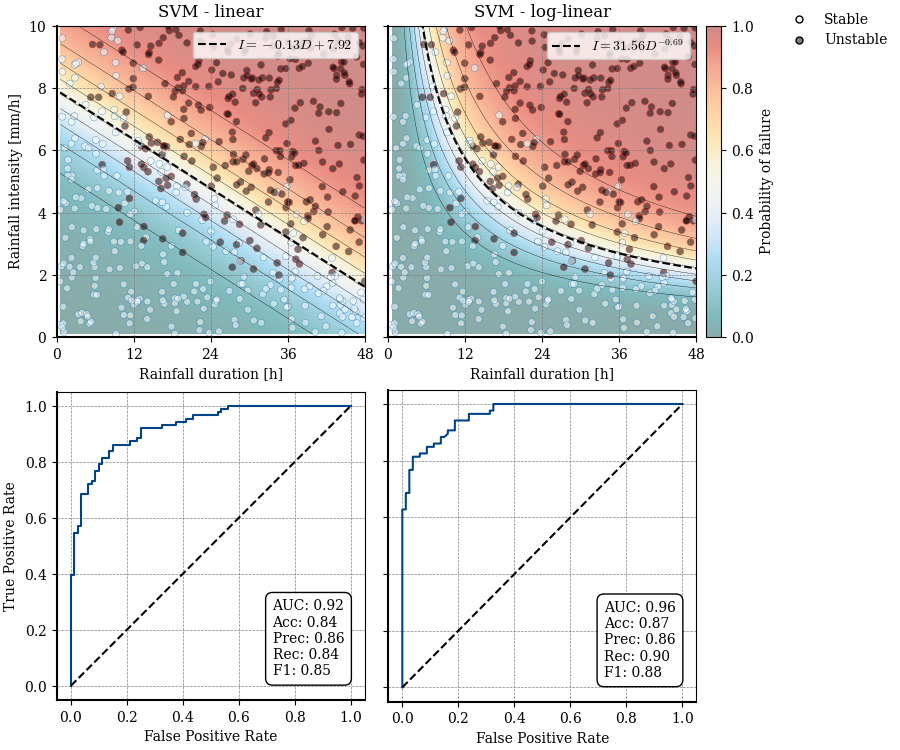

In [67]:
models = {
    # 'Probit': None,
    # 'Logistic regression': LogisticRegression(),
    'SVM - linear': SVC(kernel='linear', probability=True, random_state=123),
    'SVM - log-linear': SVC(kernel='linear', probability=True, random_state=123),
    # 'SVM - $2^\\mathrm{nd}$ deg. poly': SVC(kernel='poly', probability=True, random_state=123, degree=2),
    # 'SVM - $3^\\mathrm{rd}$ deg. poly': SVC(kernel='poly', probability=True, random_state=123, degree=3),
    # 'SVM - RDF': SVC(kernel='rbf', probability=True, random_state=123),
    # 'GPC': GaussianProcessClassifier(random_state=123),
    # 'SVM_sigmoid': SVC(kernel='sigmoid', probability=True, random_state=123),
    # 'Gradient Boosting': GradientBoostingClassifier()
}

facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("#125A56", alpha=0.5), True: mpl.colors.to_rgba("#A01813", alpha=0.5)})
facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
# Plot the probability of failure surface
# fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(6, 5.5), sharex='row', sharey='row', layout='constrained')#
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(9, 7.5), sharex='row', sharey='row', layout='constrained')#

for i, (name, model) in enumerate(models.items()):
    if name == 'Probit':
        # Fit the probit model
        X_test_prob = sm.add_constant(X_test)
        X_train_prob = sm.add_constant(X_train)
        model_prob = sm.Probit(y_train, X_train_prob)
        fitted_model_prob = model_prob.fit()

        # Predict probabilities
        y_pred_pr = fitted_model_prob.predict(X_test_prob)
        y_pred = y_pred_pr > 0.5

        zz = fitted_model_prob.predict(sm.add_constant(np.vstack([xx.ravel(), yy.ravel()]).T)).reshape(xx.shape)
    elif name == 'SVM - log-linear':
        X_train_log, X_test_log = np.log(X_train), np.log(X_test)

        model.fit(X_train_log, y_train)
        y_pred_pr = model.predict_proba(X_test_log)[:, 1]
        y_pred = model.predict(X_test_log)

        zz = model.predict_proba(np.log(np.vstack([xx.ravel(), yy.ravel()]).T))[:, 1].reshape(xx.shape)
        
        # Hyperplane equation
        α = np.exp(- model.intercept_[0] / model.coef_[0, 1])
        β = - model.coef_[0, 0] / model.coef_[0, 1]
        x_hyperplane = np.log(x)
        y_hyperplane = α*x**β
        label = f'$I = {α:.2f} D^{{{β:.2f}}}$'
    else:
        model.fit(X_train, y_train)
        y_pred_pr = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

        zz = model.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)
        
        # Hyperplane equation
        m = - model.coef_[0, 0] / model.coef_[0, 1]
        b = - model.intercept_[0] / model.coef_[0, 1]
        x_hyperplane = x
        y_hyperplane = m*x_hyperplane + b
        label = f'$I = {m:.2f} D + {b:.2f}$'

    fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
    # auc_score = roc_auc_score(y_true=y_test, y_score=y_pred_pr)

    # metrics
    roc_auc = roc_auc_score(y_test, y_pred_pr)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Plot the probability of failure surface
    ax = axs[0, i]
    c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
                  cmap=cmap, alpha=0.5, vmin=0, vmax=1, aspect='auto')
    ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.25, linestyles='-')    
    ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=.25)
    # Plot the hyperplane
    ax.plot(x, y_hyperplane, color='k', lw=1.5, ls='--', label=label)
    ax.legend(loc='upper right')#, frameon=False)
    
    # Plot settings
    ax.set(xlabel='Rainfall duration [h]', xlim=xlim, ylim=ylim)
    ax.set_title(f'{name}')

    # Plot ROC curve
    ax = axs[1, i]
    ax.plot(fpr, tpr, c=tol_cols[0])
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set(xlabel='False Positive Rate')
    # text instead of legend
    # ax.text(0.62, 0.07, f'AUC: {roc_auc:.2f}\nAcc: {accuracy:.2f}\nPrec: {precision:.2f}\nRec: {recall:.2f}\nF1: {f1:.2f}',
    ax.text(0.7, 0.07, f'AUC: {roc_auc:.2f}\nAcc: {accuracy:.2f}\nPrec: {precision:.2f}\nRec: {recall:.2f}\nF1: {f1:.2f}',
            verticalalignment='bottom', horizontalalignment='left', transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

axs[0, 0].set(xlim=[0, 48], ylim=[0, 10])
axs[0, 0].xaxis.set_major_locator(mpl.ticker.MultipleLocator(12))
axs[0, 0].set_ylabel('Rainfall intensity [mm/h]')
axs[1, 0].set_ylabel('True Positive Rate')
axs[1, 0].set_aspect('equal', adjustable='box')

# General plot settings
for ax in axs.flatten():
    ax.grid(True, color='0.5', ls='--', lw=0.5)
    ax.spines[["left", "bottom"]].set_linewidth(1.5)

# colorbar 
fig.colorbar(c, ax=axs[0], label='Probability of failure', pad=0)
# legend of the scatter plot
handles = [mpl.lines.Line2D([0], [0], marker='o', mec='k', mfc=mpl.colors.to_rgba("w", alpha=0.5), ms=5, lw=0),
            mpl.lines.Line2D([0], [0], marker='o', mec='k', mfc=mpl.colors.to_rgba("k", alpha=0.5), ms=5, lw=0)]
labels = ['Stable', 'Unstable']
# fig.legend(handles=handles, labels=labels, frameon=False, ncol=2, loc='outside lower center')#, bbox_to_anchor=(1.15, 0.5))
fig.legend(handles=handles, labels=labels, frameon=False, ncol=1, loc='outside right upper')#, bbox_to_anchor=(.95, 0.5), bbox_transform=fig.transFigure)


fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_doble.svg', dpi=300, bbox_inches='tight')

In [68]:
- model.coef_[0, 0] / model.coef_[0, 1]

-0.6875625417632408

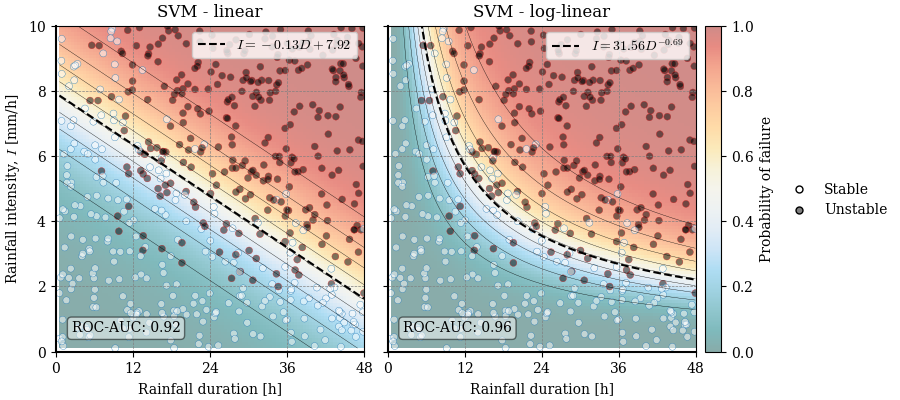

In [69]:
models = {
    'SVM - linear': SVC(kernel='linear', probability=True, random_state=123),
    'SVM - log-linear': SVC(kernel='linear', probability=True, random_state=123),
}

facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("#125A56", alpha=0.5), True: mpl.colors.to_rgba("#A01813", alpha=0.5)})
facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
# Plot the probability of failure surface
# fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 3.25), sharex='row', sharey='row', layout='constrained')#
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), sharex='row', sharey='row', layout='constrained')#

for i, (name, model) in enumerate(models.items()):
    if name == 'SVM - log-linear':
        X_train_log, X_test_log = np.log(X_train), np.log(X_test)

        model.fit(X_train_log, y_train)
        y_pred_pr = model.predict_proba(X_test_log)[:, 1]
        y_pred = model.predict(X_test_log)

        zz = model.predict_proba(np.log(np.vstack([xx.ravel(), yy.ravel()]).T))[:, 1].reshape(xx.shape)
        
        # Hyperplane equation
        α = np.exp(- model.intercept_[0] / model.coef_[0, 1])
        β = - model.coef_[0, 0] / model.coef_[0, 1]
        x_hyperplane = np.log(x)
        y_hyperplane = α*x**β
        label = f'$I = {α:.2f} D^{{{β:.2f}}}$'
    else:
        model.fit(X_train, y_train)
        y_pred_pr = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

        zz = model.predict_proba(np.vstack([xx.ravel(), yy.ravel()]).T)[:, 1].reshape(xx.shape)

        # Hyperplane equation
        m = - model.coef_[0, 0] / model.coef_[0, 1]
        b = - model.intercept_[0] / model.coef_[0, 1]
        x_hyperplane = x
        y_hyperplane = m*x_hyperplane + b
        label = f'$I = {m:.2f} D + {b:.2f}$'

    # Plot the probability of failure surface
    ax = axs[i]
    c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()), origin='lower',
                  cmap=cmap, alpha=0.5, vmin=0, vmax=1, aspect='auto')
    ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.25, linestyles='-')    
    ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=.25)
    # Plot the hyperplane
    ax.plot(x, y_hyperplane, color='k', lw=1.5, ls='--', label=label)

    # Metrics
    fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
    roc_auc = roc_auc_score(y_test, y_pred_pr)
    
    # Plot settings
    ax.set(xlabel='Rainfall duration [h]', xlim=xlim, ylim=ylim)
    ax.set_title(f'{name}')
    ax.grid(True, color='0.5', ls='--', lw=0.5)
    ax.spines[["left", "bottom"]].set_linewidth(1.5)
    ax.legend(loc='upper right')#, frameon=False)

    ax.text(0.05, 0.05, f'ROC-AUC: {roc_auc:.2f}',
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes, fontsize=10,
            bbox=dict(alpha=0.5, facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

axs[0].set(xlim=[0, 48], ylim=[0, 10])
axs[0].xaxis.set_major_locator(mpl.ticker.MultipleLocator(12))
axs[0].set_ylabel('Rainfall intensity, $I$ [mm/h]')

# # General plot settings
# for ax in axs.flatten():

# colorbar
# fig.colorbar(c, ax=axs, label='Probability of failure', pad=0.05, orientation='horizontal',
#              shrink=0.8, aspect=40)
fig.colorbar(c, ax=axs, label='Probability of failure', pad=0)
# legend of the scatter plot
handles = [mpl.lines.Line2D([0], [0], marker='o', mec='k', mfc=mpl.colors.to_rgba("w", alpha=0.5), ms=5, lw=0),
            mpl.lines.Line2D([0], [0], marker='o', mec='k', mfc=mpl.colors.to_rgba("k", alpha=0.5), ms=5, lw=0)]
labels = ['Stable', 'Unstable']
# fig.legend(handles=handles, labels=labels, frameon=False, ncol=2, loc='outside lower center')#, bbox_to_anchor=(1.15, 0.5))
fig.legend(handles=handles, labels=labels, frameon=False, ncol=1, loc='outside right center')#, bbox_to_anchor=(1.15, 0.5))


fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_simple.svg', dpi=300, bbox_inches='tight')

In [116]:
x = np.linspace(df_thresholds['t'].min(), df_thresholds['t'].max(), 500)
y = np.linspace(df_thresholds['Inz'].min(), df_thresholds['Inz'].max(), 500)
xx, yy = np.meshgrid(x, y)

# x = np.linspace(0, df_thresholds['t'].max(), 100)
# y = np.linspace(0, df_thresholds['Inz'].max(), 100)
# xx, yy = np.meshgrid(x, y)

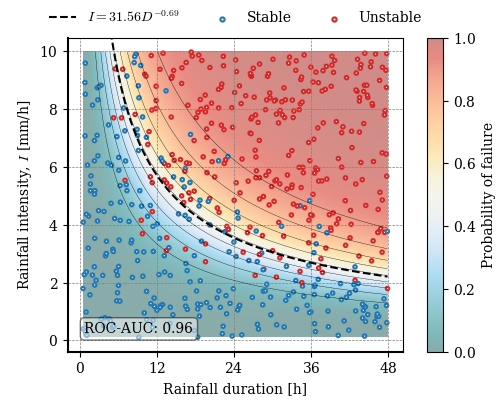

In [117]:
facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("#125A56", alpha=0.5), True: mpl.colors.to_rgba("#A01813", alpha=0.5)})
facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})


# edgecolors = df_thresholds['failed'].map({False: cols[0], True: cols[1]})
edge_cols = [mpl.colors.to_rgba('C0', alpha=1), mpl.colors.to_rgba('C3', alpha=1)] #'k'# cols[0]
fill_cols = mpl.colors.to_rgba('w', alpha=0.0)
# facecolors = df_thresholds['failed'].map({False: mpl.colors.to_rgba("w", alpha=0.5), True: mpl.colors.to_rgba("k", alpha=0.5)})
edgecolors = df_thresholds['failed'].map({False: edge_cols[0], True: edge_cols[1]})


fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5., 4), sharex='row', sharey='row', layout='constrained')#

X_train_log, X_test_log = np.log(X_train), np.log(X_test)

model.fit(X_train_log, y_train)
y_pred_pr = model.predict_proba(X_test_log)[:, 1]
y_pred = model.predict(X_test_log)

zz = model.predict_proba(np.log(np.vstack([xx.ravel(), yy.ravel()]).T))[:, 1].reshape(xx.shape)

# Hyperplane equation
α = np.exp(- model.intercept_[0] / model.coef_[0, 1])
β = - model.coef_[0, 0] / model.coef_[0, 1]
x_hyperplane = np.log(x)
y_hyperplane = α*x**β
label = f'$I = {α:.2f} D^{{{β:.2f}}}$'

# Plot the probability of failure surface
c = ax.imshow(zz, extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()),
              origin='lower', cmap=cmap, alpha=0.5, vmin=0, vmax=1, aspect='auto')
ax.contour(xx, yy, zz, levels=10, alpha=1, colors='k', linewidths=.25, linestyles='-')
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='.', s=25, edgecolors=edgecolors, facecolors='w', linewidths=1.5)
# Plot the hyperplane
ax.plot(x, y_hyperplane, color='k', lw=1.5, ls='--', label=label)

# Metrics
fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_pred_pr)
roc_auc = roc_auc_score(y_test, y_pred_pr)

# Plot settings
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity, $I$ [mm/h]', xlim=xlim, ylim=ylim, aspect=4.5)
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(12))
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)
ax.legend(loc='upper right')#, frameon=False)
ax.text(0.05, 0.05, f'ROC-AUC: {roc_auc:.2f}',
        verticalalignment='bottom', horizontalalignment='left',
        transform=ax.transAxes, fontsize=10,
        bbox=dict(alpha=0.5, facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

fig.colorbar(c, ax=ax, label='Probability of failure', pad=0)

# legend 
for label, format in zip(['Stable', 'Unstable'], edge_cols):
    ax.scatter([], [], marker='.', edgecolors=format, facecolors='w', label=label, linewidths=1.5)
ax.legend(loc='lower center', ncols=3, bbox_to_anchor=(0.5, 1.0), frameon=False)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_simple_log.svg', dpi=300, bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


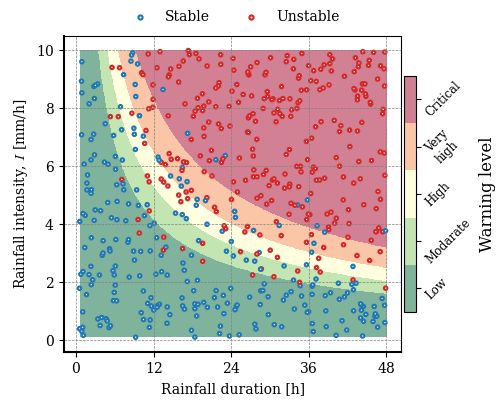

In [159]:
def reclass_raster(field, limits):
    """Reclassify a raster based on a list of limits.

    Convert a continuous raster into a categorical one. The limits are used to
    define the categories.

    Parameters
    ----------
    field : (m, n) ndarray
        2D array with the spatial field to be reclassified.
    limits : array_like
        Limits to be used in the reclassification. The minimum and maximum
        values of the field should *not* be included as the first and last
        elements of the list, as they are automatically included in the limits.

    Returns
    -------
    field_reclass : (m, n) ndarray
        2D array with the reclassified field.
    """
    limits = np.hstack((np.nanmin(field), limits, np.nanmax(field)))
    field_reclass = np.full_like(field, np.nan)
    for i in range(len(limits[:-1])):
        field_reclass[np.logical_and(field >= limits[i], field <= limits[i + 1])] = i
    return field_reclass

field_reclass = reclass_raster(zz, [0.25, 0.5, 0.75])
field_reclass = reclass_raster(zz, [.2, 0.40, 0.6, 0.80])
cmap_discr = plt.colormaps.get_cmap(cmap).resampled(n)
cmap_discr = plt.colormaps.get_cmap('RdYlGn_r').resampled(n)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5., 4), sharex='row', sharey='row', layout='constrained')#

field = field_reclass
ticks = np.unique(field)[~np.isnan(np.unique(field))]  # For colorbar
n = len(ticks)
field_r = np.full_like(field, np.nan)  # Empty reclasified field
ticks_r = np.arange(n)  # Ticks to use in reclasified field
for i in ticks_r:  #  Fill reclasified field
    field_r[field == ticks[i]] = i
im = ax.imshow(
    field_r,  # plots the reclasified field instead of the original
    cmap=cmap_discr,
    extent=(df_thresholds['t'].min(), df_thresholds['t'].max(), df_thresholds['Inz'].min(), df_thresholds['Inz'].max()),
    alpha=0.5,
    vmin=-0.5,
    vmax=n - 0.5,
    origin='lower'
) 
ax.scatter(df_thresholds['t'], df_thresholds['Inz'], marker='.', s=25, edgecolors=edgecolors, facecolors='w', linewidths=1.5)

# Plot settings
ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity, $I$ [mm/h]', xlim=xlim, ylim=ylim, aspect=4.5)
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(12))
ax.grid(True, color='0.5', ls='--', lw=0.5)
ax.spines[["left", "bottom"]].set_linewidth(1.5)
ax.legend(loc='upper right')#, frameon=False)

# fig.colorbar(c, ax=ax, label='Probability of failure', pad=0)
cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.01, ticks=ticks_r)
ticks = np.round(ticks, 1) if ticks.dtype == np.float64 else ticks
ticks = ['Low', 'Modarate', 'High', 'Critical']
ticks = ['Low', 'Modarate', 'High', 'Very\nhigh', 'Critical']
# label = kwargs.get("label", ticks)
_ = cbar.ax.set_yticklabels(ticks, va="center")
cbar.ax.tick_params(axis="y", labelrotation=45, labelsize="small", pad=1.5)
cbar.set_label('Warning level', rotation=90, size="large")

# legend 
for label, format in zip(['Stable', 'Unstable'], edge_cols):
    ax.scatter([], [], marker='.', edgecolors=format, facecolors='w', label=label, linewidths=1.5)
ax.legend(loc='lower center', ncols=3, bbox_to_anchor=(0.5, 1.0), frameon=False)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_simple_log_discr.svg', dpi=300, bbox_inches='tight')

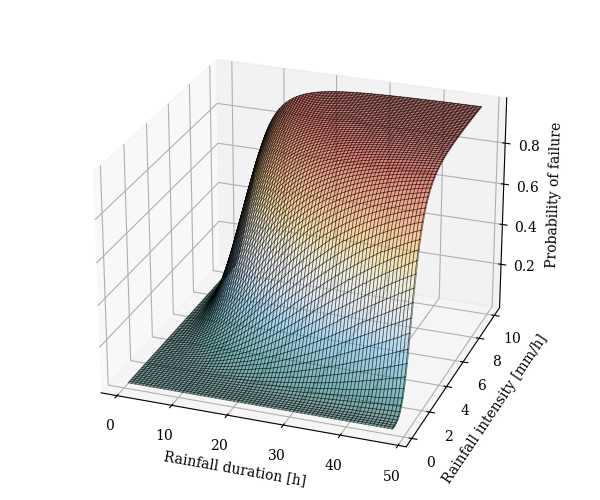

In [167]:
# 3D plot of the probability of failure surface
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(xx, yy, zz, cmap=cmap, alpha=0.5, edgecolor='k', lw=0.5, rcount=75, ccount=75)
# ax.scatter(df_thresholds['t'], df_thresholds['Inz'], df_thresholds['failed'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)

ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', zlabel='Probability of failure')


# ax.view_init(30, 200)
ax.view_init(25, 290)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_simple_log3d.svg', dpi=300, transparent=True)#, bbox_inches='tight')

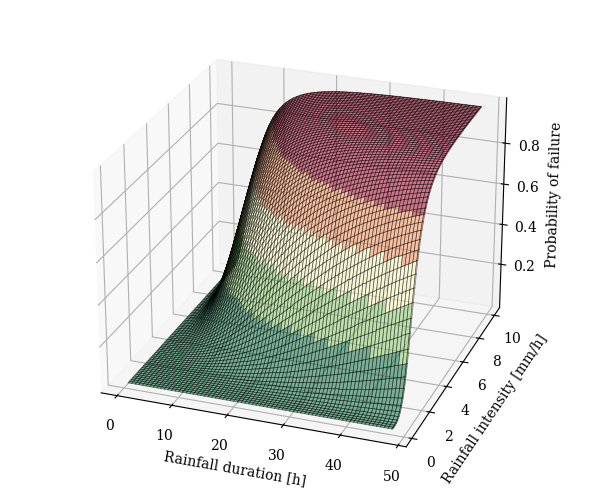

In [140]:
# 3D plot of the probability of failure surface
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')

cmap_discr = plt.colormaps.get_cmap('RdYlGn_r').resampled(n)
norm = plt.Normalize(ticks_r.min(), ticks_r.max())
colors = cmap_discr(norm(field_r))
ax.plot_surface(xx, yy, zz, cmap=cmap, facecolors=colors, alpha=0.5, edgecolor='k', lw=0.5, rcount=75, ccount=75)
# ax.scatter(df_thresholds['t'], df_thresholds['Inz'], df_thresholds['failed'], marker='o', s=25, edgecolors=edgecolors, facecolors=facecolors, linewidths=1.5)

ax.set(xlabel='Rainfall duration [h]', ylabel='Rainfall intensity [mm/h]', zlabel='Probability of failure')


# ax.view_init(30, 200)
ax.view_init(25, 290)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()

fig.savefig('figs/linear_vs_loglinear_SVM_results_simple_log3d_discr.svg', dpi=300, transparent=True)#, bbox_inches='tight')

### ROC analysis

In [141]:
cols = tol_cset('bright')

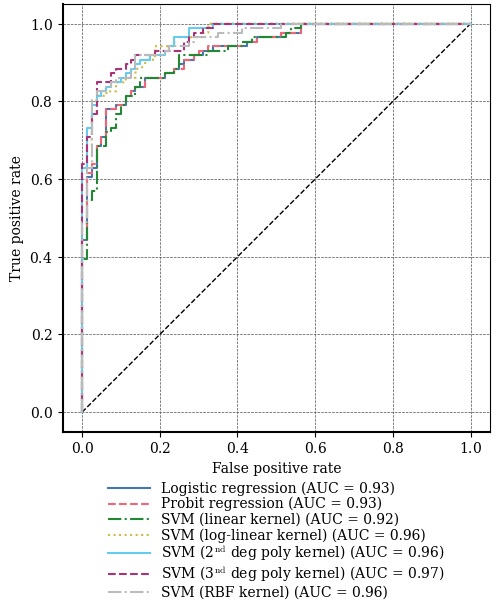

In [142]:
fig, ax = plt.subplots(figsize=(5, 6))
ax.plot([0, 1], [0, 1], c='k', ls='--', lw=1)
ax.plot(fpr_log, tpr_log, ls='-', c=cols[0], label=f'Logistic regression (AUC = {auc_score_log:.2f})')
ax.plot(fpr_prob, tpr_prob, ls='--', c=cols[1], label=f'Probit regression (AUC = {auc_score_prob:.2f})')
ax.plot(fpr_svg_linear, tpr_svg_linear, ls='-.', c=cols[2], label=f'SVM (linear kernel) (AUC = {auc_score_svg_linear:.2f})')
ax.plot(fpr_svg_loglinear, tpr_svg_loglinear, ls=':', c=cols[3], label=f'SVM (log-linear kernel) (AUC = {auc_score_svg_loglinear:.2f})')
ax.plot(fpr_svg_poly_2, tpr_svg_poly_2, ls='-', c=cols[4], label=f'SVM (2$^\\mathrm{{nd}}$ deg poly kernel) (AUC = {auc_score_svg_poly_2:.2f})')
ax.plot(fpr_svg_poly_3, tpr_svg_poly_3, ls='--', c=cols[5], label=f'SVM (3$^\\mathrm{{nd}}$ deg poly kernel) (AUC = {auc_score_svg_poly_3:.2f})')
ax.plot(fpr_svg_rbf, tpr_svg_rbf, ls='-.', c=cols[6], label=f'SVM (RBF kernel) (AUC = {auc_score_svg_rbf:.2f})')
# ax.plot(fpr_svg_sigmoid, tpr_svg_sigmoid, ls='--', c=cols[6], label=f'SVM (Sigmoid kernel) (AUC = {auc_score_svg_sigmoid:.2f})')

ax.set(xlabel='False positive rate', ylabel='True positive rate',)
ax.grid(True, color='0.3', ls='--', lw=0.5)
ax.set_aspect('equal')
ax.spines[["left", "bottom"]].set_linewidth(1.5)

ax.legend(loc='upper center', ncols=1, bbox_to_anchor=(0.5, -0.1), frameon=False,
          labelspacing=0.1, borderaxespad=0.1, handlelength=3)
# ax.legend(loc='center left', ncols=1, bbox_to_anchor=(1, 0.5), frameon=False,
#           labelspacing=0.1, borderaxespad=0.1, handlelength=1.5)

fig.canvas.header_visible = False
fig.canvas.toolbar_position = 'bottom'
plt.show()
